<a href="https://colab.research.google.com/github/anisayari/faceHIDEE/blob/master/video_youtube_human_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#@title import libs
!pip install pytube
!pip install imagehash
!pip install facenet-pytorch

from tqdm.notebook import tqdm


import imagehash

import pytube
from IPython.display import HTML
from base64 import b64encode
import logging

!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt  # install dependencies

from models.experimental import attempt_load
from utils.datasets import LoadImages, LoadStreams
from utils.general import apply_classifier, check_img_size, check_imshow, check_requirements, check_suffix, colorstr, \
    increment_path, non_max_suppression, print_args, save_one_box, scale_coords, set_logging, \
    strip_optimizer, xyxy2xywh
from utils.plots import colors
from utils.torch_utils import load_classifier, select_device, time_sync
from utils.general import user_config_dir, is_ascii, is_chinese, xywh2xyxy, xyxy2xywh

%cd ..

import torch
from IPython.display import Image, clear_output  # to display images

clear_output()
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

import argparse
import os
import sys
from pathlib import Path

import cv2
import numpy as np
import torch
import torch.backends.cudnn as cudnn


import json
import os
from PIL import Image
import random

import json 
import os
import time

import numpy as np
import torch

import gc
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px



logging.basicConfig()
logger = logging.getLogger(__name__)
logger.setLevel(logging.INFO)
logger.info('Initialisation DONE')

INFO:__main__:Initialisation DONE


Setup complete. Using torch 1.9.0+cu111 (Tesla P100-PCIE-16GB)


In [ ]:
#@title Select Youtube video
url = 'https://www.youtube.com/watch?v=keOaQm6RpBg' #@param {type:"raw"}
logger.info('Video downloading...')
try:
    youtube = pytube.YouTube(url)
except:
    logger.error(f'The URL {url} is not a correct youtube video link')

video = youtube.streams.get_highest_resolution()
video_file_path = video.download() # In Same Folder
logger.info('Video downloaded')
print(a)

logger.info('Displaying the video...')
mp4 = open(video_file_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

INFO:__main__:Video downloading...
INFO:__main__:Video downloaded
INFO:__main__:Displaying the video...


/content/Eds Heinz Ad.mp4


In [50]:
#@title utils
class Annotator:
    # YOLOv5 Annotator for train/val mosaics and jpgs and detect/hub inference annotations
    def __init__(self, im, line_width=None, font_size=None, font='Arial.ttf', pil=False, example='abc'):
        assert im.data.contiguous, 'Image not contiguous. Apply np.ascontiguousarray(im) to Annotator() input images.'
        self.pil = pil or not is_ascii(example) or is_chinese(example)
        if self.pil:  # use PIL
            self.im = im if isinstance(im, Image.Image) else Image.fromarray(im)
            self.draw = ImageDraw.Draw(self.im)
            self.font = check_font(font='Arial.Unicode.ttf' if is_chinese(example) else font,
                                   size=font_size or max(round(sum(self.im.size) / 2 * 0.035), 12))
        else:  # use cv2
            self.im = im
        self.lw = line_width or max(round(sum(im.shape) / 2 * 0.003), 2)  # line width

    def box_label(self, box, label='', color=(128, 128, 128), txt_color=(255, 255, 255)):
        # Add one xyxy box to image with label
        if self.pil or not is_ascii(label):
            self.draw.rectangle(box, width=self.lw, outline=color)  # box
            if label:
                w, h = self.font.getsize(label)  # text width, height
                outside = box[1] - h >= 0  # label fits outside box
                self.draw.rectangle([box[0],
                                     box[1] - h if outside else box[1],
                                     box[0] + w + 1,
                                     box[1] + 1 if outside else box[1] + h + 1], fill=color)
                # self.draw.text((box[0], box[1]), label, fill=txt_color, font=self.font, anchor='ls')  # for PIL>8.0
                self.draw.text((box[0], box[1] - h if outside else box[1]), label, fill=txt_color, font=self.font)
        else:  # cv2
            p1, p2 = (int(box[0]), int(box[1])), (int(box[2]), int(box[3]))
            cv2.rectangle(self.im, p1, p2, color, thickness=self.lw, lineType=cv2.LINE_AA)
            if label:
                tf = max(self.lw - 1, 1)  # font thickness
                w, h = cv2.getTextSize(label, 0, fontScale=self.lw / 3, thickness=tf)[0]  # text width, height
                outside = p1[1] - h - 3 >= 0  # label fits outside box
                p2 = p1[0] + w, p1[1] - h - 3 if outside else p1[1] + h + 3
                cv2.rectangle(self.im, p1, p2, color, -1, cv2.LINE_AA)  # filled
                cv2.putText(self.im, label, (p1[0], p1[1] - 2 if outside else p1[1] + h + 2), 0, self.lw / 3, txt_color,
                            thickness=tf, lineType=cv2.LINE_AA)

    def rectangle(self, xy, fill=None, outline=None, width=1):
        # Add rectangle to image (PIL-only)
        self.draw.rectangle(xy, fill, outline, width)

    def text(self, xy, text, txt_color=(255, 255, 255)):
        # Add text to image (PIL-only)
        w, h = self.font.getsize(text)  # text width, height
        self.draw.text((xy[0], xy[1] - h + 1), text, fill=txt_color, font=self.font)

    def result(self):
        # Return annotated image as array
        return np.asarray(self.im)

#GET FACE---------------------- MTCNN

def init_mtcnn():
    logging.info('Init face recognition model...')
    from facenet_pytorch import MTCNN
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    mtcnn = MTCNN(device=device)
    print('Running on device: {}'.format(device))
    logging.info('Init face recognition model DONE')
    return mtcnn

def get_face(frame,mtcnn):
    #save_path = f'/content/results/faces_found/frame{number_of_frame}-output.jpg'
    img_cropped,prob = mtcnn(frame, save_path=None,return_prob=True)
    return img_cropped, prob

def find_all_person_in_video(video_path):
    logging.info('Finding all faces in the video...')
    # Create a VideoCapture object
    # If required, create a face detection pipeline using MTCNN:
    # Create an inception resnet (in eval mode):

    mtcnn = init_mtcnn()
    #img = Image.open('/content/1.png').convert('RGB')

    aligned = []
    names = []

    cap = cv2.VideoCapture(video_path)
    total_number_of_frame = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    for number_of_frame in tqdm(range(0,total_number_of_frame)):
        #if number_of_frame > 200: #for debug purpose
        #    break
        ret, frame = cap.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        #number_of_frame = cap.get(cv2.CAP_PROP_POS_FRAMES)

        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
        
        img_cropped, prob = get_face(frame,mtcnn)

        if img_cropped is not None:
            #print(prob)
            #print('Face detected with probability: {:8f}'.format(prob))
            aligned.append(img_cropped)
            names.append(f"frame{number_of_frame}")

        #cv2.imwrite('/content/results/face_found/results.jpg',frame)
    logging.info('Finding all faces in the video DONE')
    return aligned, names

#GET EMBEDDINGS ---------- Resnet / PCA
def get_embeddings_resnet(aligned):
    logging.info('Getting embeddings from Resnet...')
    from facenet_pytorch import InceptionResnetV1
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    resnet = InceptionResnetV1(pretrained='vggface2', dropout_prob=0.5, device=device).eval()
    embeddings_list = []
    for i in range(0, len(aligned), 100):
        stack = torch.stack(aligned[i:i+100]).to(device)
        embeddings = resnet(stack).detach().cpu()
        #print(embeddings.size())
        embeddings_list.append(embeddings)
    #stack = torch.stack(aligned[i:i+10]).to(device)
    #embeddings = resnet(stack).detach().cpu()
    #embeddings_list.append(embeddings)
    #print(np.shape(aligned))
    #aligned= np.expand_dims(aligned, axis=0)
    logging.info('Getting embeddings from Resnet DONE')
    #print(embeddings)
    #print(type(embeddings))
    stacked_embeddings = torch.cat(embeddings_list)
    #print(stacked_embeddings)
    #print(type(stacked_embeddings))
    return stacked_embeddings

def run_PCA(aligned,names, plot=True):
    logging.info('Running PCA...')
    from sklearn.decomposition import PCA
    import matplotlib.pyplot as plt

    embeddings = get_embeddings_resnet(aligned)

    dists = [[(e1 - e2).norm().item() for e2 in embeddings] for e1 in embeddings]
    print(pd.DataFrame(dists, columns=names, index=names))

    %matplotlib inline

    inds = range(88)
    PCA_model = PCA(n_components=3, random_state=33).fit(embeddings)
    X_pca1 = PCA_model.transform(embeddings)
    y = [i for i in range(0,len(names))]
    if plot:
        total_var = PCA_model.explained_variance_ratio_.sum() * 100

        fig = px.scatter_3d(
            X_pca1, x=0, y=1, z=2, color=y,
            title=f'Total Explained Variance: {total_var:.2f}%',
            labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
        )
        fig.show()

        exp_var_cumul = np.cumsum(PCA_model.explained_variance_ratio_)

        fig = px.area(
            x=range(1, exp_var_cumul.shape[0] + 1),
            y=exp_var_cumul,
            labels={"x": "# Components", "y": "Explained Variance"}
        )
        fig.show()
        """
        fig, ax = plt.subplots(1, 1, figsize=(12, 8))
        img = ax.scatter(X_pca1[:, 0], X_pca1[:, 1], c=y, alpha=0.5, cmap=plt.cm.get_cmap('nipy_spectral', 10))
            
        plt.title('PCA method')
        plt.suptitle('Face embeddings')

        cbar = plt.colorbar(img, ax=ax)
        #cbar.ax.set_yticklabels(np.unique(trainLabels[inds])) 
        plt.show()
        """
    logging.info('Running PCA DONE')
    return X_pca1,y,PCA_model

#ELBOW EVALUATION ---------- optional 
def elbow_evaluation(X_pca1):
    distortions = []
    K = range(1,10)
    for k in K:
        kmeanModel = KMeans(n_clusters=k)
        kmeanModel.fit(X_pca1)
        distortions.append(kmeanModel.inertia_)
    print(distortions)
    plt.figure(figsize=(16,8))
    plt.plot(K, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distortion')
    plt.title('The Elbow Method showing the optimal k')
    plt.savefig('./plot/elbow_evaluation.png', dpi=200) 
    coeff= []
    for i in range(len(distortions)-1):
        coeff.append(distortions[i+1] + distortions[i-1] - 2 * distortions[i])
    best_k = coeff.index((max(coeff)))+1
    print('BEST K FOUND {}'.format(best_k))
    return best_k

def silhouette_evaluation(X_pca):
    logging.info('Running silhouette evaluation...')
    import pandas as pd
    import numpy as np
    import matplotlib.pyplot as plt
    %matplotlib inline 
    from sklearn.cluster import KMeans
    from sklearn import datasets
    from sklearn.metrics import silhouette_score

    silhouette = []
    K = range(2,10)

    for k in K:
        kmeans = KMeans(n_clusters = k).fit(X_pca)
        labels = kmeans.labels_
        silhouette.append(silhouette_score(X_pca, labels, metric = 'euclidean'))
    
    plt.figure(figsize=(16,8))
    plt.plot(K, silhouette, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette')
    plt.title('Silhouette score')
    plt.show()
    logging.info('Silhouette evaluation DONE')


# CLUSTERING ---------------- KMEANS
def run_clustering_algorithm(X_pca1,y,number_of_clusters):
    logging.info('Running clustering algorithm...')
    from sklearn.cluster import KMeans
    kmeans = KMeans(n_clusters=number_of_clusters)
    kmeans.fit(X_pca1)
    y_kmeans = kmeans.predict(X_pca1)

    plt.scatter(X_pca1[:, 0], X_pca1[:, 1], c=y_kmeans, s=50, cmap='viridis')

    fig = px.scatter_3d(
            X_pca1, x=0, y=1, z=2, color=y_kmeans,
            title=f'Kmeans',
            labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
        )
    fig.show()

    centers = kmeans.cluster_centers_
    plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)
    logging.info('Running clustering algorithm DONE')
    return kmeans

def get_class_face(frame, kmeans_model, PCA_model):
    mtcnn = init_mtcnn()
    img_cropped, prob = get_face(frame,mtcnn)
    id = [-1]
    if img_cropped is not None:
        embeddings = get_embeddings_resnet([img_cropped])
        X = PCA_model.transform(embeddings)
        id = kmeans_model.predict(X)
    return id[0]

In [53]:
#@title nothing here interesting
"""
#for debug gpu memory usage CUDA purpose
%whos

import sys
def sizeof_fmt(num, suffix='B'):
    for unit in ['','Ki','Mi','Gi','Ti','Pi','Ei','Zi']:
        if abs(num) < 1024.0:
            return "%3.1f %s%s" % (num, unit, suffix)
        num /= 1024.0
    return "%.1f %s%s" % (num, 'Yi', suffix)

for name, size in sorted(((name, sys.getsizeof(value)) for name, value in locals().items()),
                         key= lambda x: -x[1])[:10]:
    print("{:>30}: {:>8}".format(name, sizeof_fmt(size)))

#------

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

torch.cuda.memory_summary(device=device, abbreviated=False)

torch.cuda.ipc_collect()

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

torch.cuda.memory_summary(device=device, abbreviated=False)


#-----


i=0
for obj in gc.get_objects():
    try:
        if torch.is_tensor(obj) or (hasattr(obj, 'data') and torch.is_tensor(obj.data)):
            print(type(obj), obj.size(), obj.__name__)
            i += 1
    except:
        pass

print(i)

#-----

torch.cuda.list_gpu_processes(device=device)

#-----

import gc
gc.collect()
torch.cuda.empty_cache()
!nvidia-smi

#--------

def p():
    c = torch.cuda.memory_reserved()
    print(f'cached   :{c}')
    a = torch.cuda.memory_allocated()
    print(f'allocated:{a}')
    f = torch.cuda.memory_reserved()-torch.cuda.memory_allocated()
    print(f'free     :{f}')
    print('-----------')
 
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

p()
torch.cuda.reset_max_memory_allocated(device=device)
p()
torch.cuda.reset_max_memory_cached(device=device)
p()
torch.cuda.empty_cache()
p()
torch.cuda.ipc_collect()
p()
gc.collect()
p()

"""

'\n#for debug gpu memory usage CUDA purpose\n%whos\n\nimport sys\ndef sizeof_fmt(num, suffix=\'B\'):\n    for unit in [\'\',\'Ki\',\'Mi\',\'Gi\',\'Ti\',\'Pi\',\'Ei\',\'Zi\']:\n        if abs(num) < 1024.0:\n            return "%3.1f %s%s" % (num, unit, suffix)\n        num /= 1024.0\n    return "%.1f %s%s" % (num, \'Yi\', suffix)\n\nfor name, size in sorted(((name, sys.getsizeof(value)) for name, value in locals().items()),\n                         key= lambda x: -x[1])[:10]:\n    print("{:>30}: {:>8}".format(name, sizeof_fmt(size)))\n\n#------\n\ndevice = torch.device(\'cuda:0\' if torch.cuda.is_available() else \'cpu\')\n\ntorch.cuda.memory_summary(device=device, abbreviated=False)\n\ntorch.cuda.ipc_collect()\n\ndevice = torch.device(\'cuda:0\' if torch.cuda.is_available() else \'cpu\')\n\ntorch.cuda.memory_summary(device=device, abbreviated=False)\n\n\n#-----\n\n\ni=0\nfor obj in gc.get_objects():\n    try:\n        if torch.is_tensor(obj) or (hasattr(obj, \'data\') and torch.is_te

Running on device: cuda:0


  0%|          | 0/1975 [00:00<?, ?it/s]

             frame0    frame1    frame2    frame3    frame4  ...  frame1910  \
frame0     0.000000  1.017278  0.958055  1.249563  1.118959  ...   1.261115   
frame1     1.017278  0.000000  0.605923  0.988748  1.234848  ...   1.205261   
frame2     0.958055  0.605923  0.000000  1.133736  1.116962  ...   1.309742   
frame3     1.249563  0.988748  1.133736  0.000000  1.251421  ...   1.206057   
frame4     1.118959  1.234848  1.116962  1.251421  0.000000  ...   1.325489   
...             ...       ...       ...       ...       ...  ...        ...   
frame1910  1.261115  1.205261  1.309742  1.206057  1.325489  ...   0.000000   
frame1911  1.267667  1.202338  1.302636  1.183434  1.330128  ...   0.223021   
frame1912  1.250853  1.196106  1.305153  1.186767  1.326543  ...   0.208404   
frame1913  1.257737  1.234598  1.324664  1.209034  1.326959  ...   0.192656   
frame1914  1.257477  1.231609  1.324020  1.202211  1.322238  ...   0.250648   

           frame1911  frame1912  frame1913  frame19

[725.5145773919046, 323.54929367737134, 132.97403746060743, 72.24730316222372, 51.74790321775805, 44.565156806838786, 39.09273729151555, 34.94820651364985, 31.634312765750558]
BEST K FOUND 2


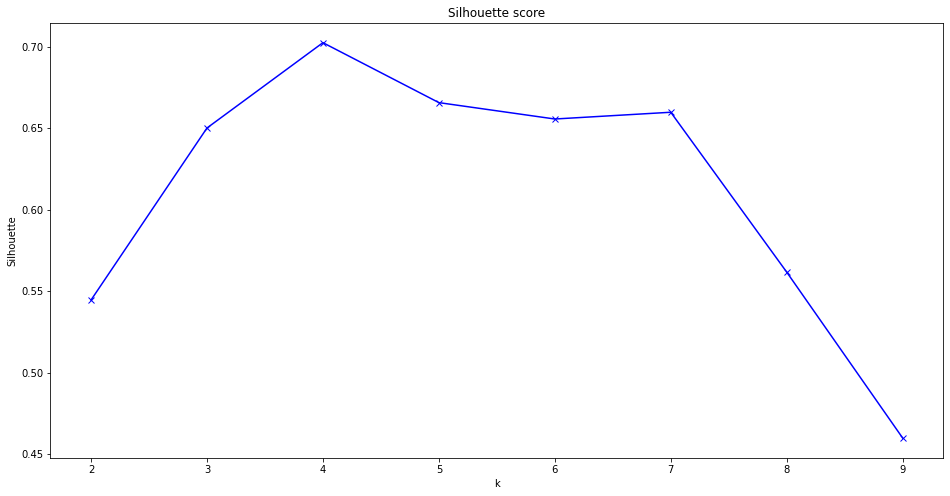

[(13, 156, 126), (190, 82, 84), (44, 241, 159)]

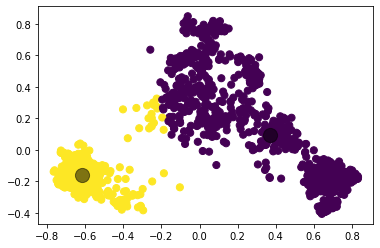

In [54]:
#@title Detection and Training of people

plot = True
if plot:
    Path("./plot/").mkdir(parents=True, exist_ok=True)
    
video_path = video_file_path
aligned, names = find_all_person_in_video(video_path)

gc.collect()
torch.cuda.empty_cache()
torch.cuda.ipc_collect()

X_pca,y,PCA_model = run_PCA(aligned,names, plot=True)
best_k = elbow_evaluation(X_pca)
silhouette_evaluation(X_pca)
number_of_clusters = best_k
kmeans_model = run_clustering_algorithm(X_pca,y, number_of_clusters)

color=[]

for i in range(0,number_of_clusters+1):
    r = lambda: random.randint(0,255)
    color.append((r(),r(),r()))

color

In [ ]:
#@title get humans in video and render video in "results"
# YOLOv5 🚀 by Ultralytics, GPL-3.0 license hardly modified by Anis.A to fit the desired Use case

FILE = Path('./').resolve()
ROOT = FILE.parents[0]  # YOLOv5 root directory
if str(ROOT) not in sys.path:
    sys.path.append(str(ROOT))  # add ROOT to PATH
ROOT = Path(os.path.relpath(ROOT, Path.cwd()))  # relative

!rm -rf /content/results/current_image-*.jpg
!rm  -rf /content/results/crops/crops-*.jpg
!rm /content/data.json

if os.path.exists('/content/data.json'):
    with open('/content/data.json') as f:
        data = json.load(f)
    if video.title not in data.keys():
        data[f'{video.title}'] = {
            'knows_caracters':[]
        }
else:
    data = {  
        f'{video.title}': {
            'knows_caracters':[]
        }
    }
with open('/content/data.json', 'w') as outfile:  
    json.dump(data, outfile)

@torch.no_grad()
def run(weights=ROOT / 'yolov5s.pt',  # model.pt path(s)
        source=ROOT / 'data/images',  # file/dir/URL/glob, 0 for webcam
        imgsz=640,  # inference size (pixels)
        conf_thres=0.25,  # confidence threshold
        iou_thres=0.45,  # NMS IOU threshold
        max_det=1000,  # maximum detections per image
        device='',  # cuda device, i.e. 0 or 0,1,2,3 or cpu
        view_img=False,  # show results
        save_txt=False,  # save results to *.txt
        save_conf=False,  # save confidences in --save-txt labels
        save_crop=False,  # save cropped prediction boxes
        nosave=False,  # do not save images/videos
        classes=None,  # filter by class: --class 0, or --class 0 2 3
        agnostic_nms=False,  # class-agnostic NMS
        augment=False,  # augmented inference
        visualize=False,  # visualize features
        update=False,  # update all models
        project=ROOT / 'runs/detect',  # save results to project/name
        name='exp',  # save results to project/name
        exist_ok=False,  # existing project/name ok, do not increment
        line_thickness=3,  # bounding box thickness (pixels)
        hide_labels=False,  # hide labels
        hide_conf=False,  # hide confidences
        half=False,  # use FP16 half-precision inference
        dnn=False,  # use OpenCV DNN for ONNX inference
        ):
    source = str(source)
    save_img = not nosave and not source.endswith('.txt')  # save inference images

    # Directories
    save_dir = '/content/'  # increment run
    #(save_dir / 'labels' if save_txt else save_dir).mkdir(parents=True, exist_ok=True)  # make dir

    # Initialize
    set_logging()
    device = select_device(device)
    half &= device.type != 'cpu'  # half precision only supported on CUDA

    # Load model
    w = str(weights[0] if isinstance(weights, list) else weights)
    classify, suffix, suffixes = False, Path(w).suffix.lower(), ['.pt', '.onnx', '.tflite', '.pb', '']
    check_suffix(w, suffixes)  # check weights have acceptable suffix
    pt, onnx, tflite, pb, saved_model = (suffix == x for x in suffixes)  # backend booleans
    stride, names = 64, [f'class{i}' for i in range(1000)]  # assign defaults
    if pt:
        model = torch.jit.load(w) if 'torchscript' in w else attempt_load(weights, map_location=device)
        stride = int(model.stride.max())  # model stride
        names = model.module.names if hasattr(model, 'module') else model.names  # get class names
        if half:
            model.half()  # to FP16
        if classify:  # second-stage classifier
            modelc = load_classifier(name='resnet50', n=2)  # initialize
            modelc.load_state_dict(torch.load('resnet50.pt', map_location=device)['model']).to(device).eval()
    elif onnx:
        if dnn:
            # check_requirements(('opencv-python>=4.5.4',))
            net = cv2.dnn.readNetFromONNX(w)
        else:
            check_requirements(('onnx', 'onnxruntime-gpu' if torch.has_cuda else 'onnxruntime'))
            import onnxruntime
            session = onnxruntime.InferenceSession(w, None)
    else:  # TensorFlow models
        check_requirements(('tensorflow>=2.4.1',))
        import tensorflow as tf
        if pb:  # https://www.tensorflow.org/guide/migrate#a_graphpb_or_graphpbtxt
            def wrap_frozen_graph(gd, inputs, outputs):
                x = tf.compat.v1.wrap_function(lambda: tf.compat.v1.import_graph_def(gd, name=""), [])  # wrapped import
                return x.prune(tf.nest.map_structure(x.graph.as_graph_element, inputs),
                               tf.nest.map_structure(x.graph.as_graph_element, outputs))

            graph_def = tf.Graph().as_graph_def()
            graph_def.ParseFromString(open(w, 'rb').read())
            frozen_func = wrap_frozen_graph(gd=graph_def, inputs="x:0", outputs="Identity:0")
        elif saved_model:
            model = tf.keras.models.load_model(w)
        elif tflite:
            interpreter = tf.lite.Interpreter(model_path=w)  # load TFLite model
            interpreter.allocate_tensors()  # allocate
            input_details = interpreter.get_input_details()  # inputs
            output_details = interpreter.get_output_details()  # outputs
            int8 = input_details[0]['dtype'] == np.uint8  # is TFLite quantized uint8 model
    imgsz = check_img_size(imgsz, s=stride)  # check image size


    dataset = LoadImages(source, img_size=imgsz, stride=stride, auto=pt)
    bs = 1  # batch_size
    vid_path, vid_writer = [None] * bs, [None] * bs

    # Run inference
    #if pt and device.type != 'cpu':
    #    model(torch.zeros(1, 3, *imgsz).to(device).type_as(next(model.parameters())))  # run once
    dt, seen = [0.0, 0.0, 0.0], 0
    number_of_frame=0
    for path, img, im0s, vid_cap in tqdm(dataset):
        #if number_of_frame==10:
        #    break
        t1 = time_sync()
        if onnx:
            img = img.astype('float32')
        else:
            img = torch.from_numpy(img).to(device)
            img = img.half() if half else img.float()  # uint8 to fp16/32
        img /= 255.0  # 0 - 255 to 0.0 - 1.0
        if len(img.shape) == 3:
            img = img[None]  # expand for batch dim
        t2 = time_sync()
        dt[0] += t2 - t1

        # Inference
        if pt:
            visualize = increment_path(save_dir / Path(path).stem, mkdir=True) if visualize else False
            pred = model(img, augment=augment, visualize=visualize)[0]
        elif onnx:
            if dnn:
                net.setInput(img)
                pred = torch.tensor(net.forward())
            else:
                pred = torch.tensor(session.run([session.get_outputs()[0].name], {session.get_inputs()[0].name: img}))
        else:  # tensorflow model (tflite, pb, saved_model)
            imn = img.permute(0, 2, 3, 1).cpu().numpy()  # image in numpy
            if pb:
                pred = frozen_func(x=tf.constant(imn)).numpy()
            elif saved_model:
                pred = model(imn, training=False).numpy()
            elif tflite:
                if int8:
                    scale, zero_point = input_details[0]['quantization']
                    imn = (imn / scale + zero_point).astype(np.uint8)  # de-scale
                interpreter.set_tensor(input_details[0]['index'], imn)
                interpreter.invoke()
                pred = interpreter.get_tensor(output_details[0]['index'])
                if int8:
                    scale, zero_point = output_details[0]['quantization']
                    pred = (pred.astype(np.float32) - zero_point) * scale  # re-scale
            pred[..., 0] *= imgsz[1]  # x
            pred[..., 1] *= imgsz[0]  # y
            pred[..., 2] *= imgsz[1]  # w
            pred[..., 3] *= imgsz[0]  # h
            pred = torch.tensor(pred)
        t3 = time_sync()
        dt[1] += t3 - t2

        # NMS
        pred = non_max_suppression(pred, conf_thres, iou_thres, classes, agnostic_nms, max_det=max_det)
        dt[2] += time_sync() - t3

        # Second-stage classifier (optional)
        if classify:
            pred = apply_classifier(pred, modelc, img, im0s)

        # Process predictions
        for i, det in enumerate(pred):  # per image
            seen += 1
            p, s, im0, frame = path, '', im0s.copy(), getattr(dataset, 'frame', 0)

            ######### PROCESS DETECTION
            """
            img = Image.open(f'/content/{i}.png').convert('RGB')
            # Get cropped and prewhitened image tensor
            img_cropped,prob = mtcnn(frame, save_path=f'/content/results/frame{number_of_frame}-output.jpg',return_prob=True)

            if img_cropped is not None:
                print(prob)
                print('Face detected with probability: {:8f}'.format(prob))
                aligned.append(img_cropped)
                names.append(f"frame{i}")
            """

            p = Path(p)  # to Path
            save_path = f'{save_dir}/output-{p.name}'  # img.jpg
            s += '%gx%g ' % img.shape[2:]  # print string
            gn = torch.tensor(im0.shape)[[1, 0, 1, 0]]  # normalization gain whwh
            imc = im0.copy() if save_crop else im0  # for save_crop
            annotator = Annotator(im0, line_width=line_thickness, example=str(names))
            id = get_class_face(im0,kmeans_model,PCA_model)
            if len(det):
                # Rescale boxes from img_size to im0 size
                det[:, :4] = scale_coords(img.shape[2:], det[:, :4], im0.shape).round()

                # Print results
                for c in det[:, -1].unique():
                    n = (det[:, -1] == c).sum()  # detections per class
                    s += f"{n} {names[int(c)]}{'s' * (n > 1)}, "  # add to string

                # Write results
                color_list= [(255, 87, 51),(206, 255, 51),(51, 236, 255),(156, 51, 255),
                             (255, 51, 128 ),(243, 255, 51)]
                count_person = 0
                for *xyxy, conf, cls in reversed(det):
                    """
                    filename_crop = f'crop-{number_of_frame}.jpg'
                    save_one_box(xyxy, imc, file=f'{save_dir}/current_image-{number_of_frame}.jpg', BGR=True)
                    already_exist = False
                    for known_image in data[f'{video.title}']['knows_caracters']:
                        hash0 = imagehash.average_hash(Image.open(f"{save_dir}/crops/{known_image}")) 
                        #if not os.path.exists(f'{save_dir}/current_image.jpg'):
                        #    time.sleep(1)
                        #    save_one_box(xyxy, imc, file=f'{save_dir}/current_image.jpg', BGR=True)

                        hash1 = imagehash.average_hash(Image.open(f'{save_dir}/current_image-{number_of_frame}.jpg')) 
                        cutoff = 10  # maximum bits that could be different between the hashes. 
                        print(hash0 - hash1)
                        #os.remove(f'{save_dir}/current_image-{number_of_frame}.jpg')
                        if hash0 - hash1 < cutoff:
                            already_exist = True
                            color_to_pick = color[f'{known_image}']
                            break
                    if not (already_exist) and (filename_crop not in data[f'{video.title}']['knows_caracters']):
                        save_one_box(xyxy, imc, file=f'{save_dir}/crops/{filename_crop}', BGR=True)
                        data[f'{video.title}']['knows_caracters'].append(filename_crop)
                        with open('/content/data.json', 'w') as outfile:  
                            json.dump(data, outfile)
                        r = lambda: random.randint(0,255)
                        color[f'{filename_crop}'] = (r(),r(),r())
                        color_to_pick = color[f'{filename_crop}']
                        """

                    if save_img or save_crop or view_img:  # Add bbox to image
                        c = int(cls)  # integer class
                        if id == -1:
                            label = 'UNK'
                            color_to = color[-1]
                        else:
                            #print(id)
                            #print(color)
                            label = "identification: {}".format(id)
                            color_to = color[id]
                        #print(xyxy)
                        annotator.box_label(xyxy, label, color=color_to)
                    count_person += 1

            # Print time (inference-only)
            #print(f'{s}Done. ({t3 - t2:.3f}s)')

            # Stream results
            im0 = annotator.result()
            if view_img:
                cv2.imshow(str(p), im0)
                cv2.waitKey(1)  # 1 millisecond

            # Save results (image with detections)
            if save_img:
                if dataset.mode == 'image':
                    print(save_path)
                    cv2.imwrite(save_path, im0)
                else:  # 'video' or 'stream'
                    if vid_path[i] != save_path:  # new video
                        vid_path[i] = save_path
                        if isinstance(vid_writer[i], cv2.VideoWriter):
                            vid_writer[i].release()  # release previous video writer
                        if vid_cap:  # video
                            fps = vid_cap.get(cv2.CAP_PROP_FPS)
                            w = int(vid_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
                            h = int(vid_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
                        else:  # stream
                            fps, w, h = 30, im0.shape[1], im0.shape[0]
                            save_path += '.mp4'
                        vid_writer[i] = cv2.VideoWriter(save_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (w, h))
                    vid_writer[i].write(im0)
        number_of_frame+=1

    # Print results
    t = tuple(x / seen * 1E3 for x in dt)  # speeds per image
    #print(f'Speed: %.1fms pre-process, %.1fms inference, %.1fms NMS per image at shape {(1, 3, *imgsz)}' % t)
    if save_txt or save_img:
        s = f"\n{len(list(save_dir.glob('labels/*.txt')))} labels saved to {save_dir / 'labels'}" if save_txt else ''
        print(f"Results saved to {colorstr('bold', save_dir)}{s}")
    if update:
        strip_optimizer(weights)  # update model (to fix SourceChangeWarning)

# @TODO: Create folder results
run(source=video_file_path, classes=0) #Classes 0 = person
#run(source='/content/1.png', classes=0) #Classes 0 = person

  0%|          | 0/1 [00:00<?, ?it/s]

video 1/1 (1/1125) /content/MISS DIOR – The new Eau de Parfum.mp4: Running on device: cuda:0
video 1/1 (2/1125) /content/MISS DIOR – The new Eau de Parfum.mp4: Running on device: cuda:0
video 1/1 (3/1125) /content/MISS DIOR – The new Eau de Parfum.mp4: Running on device: cuda:0
video 1/1 (4/1125) /content/MISS DIOR – The new Eau de Parfum.mp4: Running on device: cuda:0
video 1/1 (5/1125) /content/MISS DIOR – The new Eau de Parfum.mp4: Running on device: cuda:0
video 1/1 (6/1125) /content/MISS DIOR – The new Eau de Parfum.mp4: Running on device: cuda:0
video 1/1 (7/1125) /content/MISS DIOR – The new Eau de Parfum.mp4: Running on device: cuda:0
video 1/1 (8/1125) /content/MISS DIOR – The new Eau de Parfum.mp4: Running on device: cuda:0
video 1/1 (9/1125) /content/MISS DIOR – The new Eau de Parfum.mp4: Running on device: cuda:0
video 1/1 (10/1125) /content/MISS DIOR – The new Eau de Parfum.mp4: Running on device: cuda:0
video 1/1 (11/1125) /content/MISS DIOR – The new Eau de Parfum.mp4: R

In [ ]:
!pip freeze > requirements.txt